# Systemy inspekcji wizualnej  
## Laboratorium  6 
Temat: Operacje morfologiczne

Instrukcję opracował: dr inż. Łukasz Jeleń  
  
Wrocław 2022

---

Nazwisko i Imię:    Paweł Pelar  
Nr albumu:  243480  
data wykonania ćwiczenia:  12.01.2024r.  

---

# 1. Narzędzia  
  
  
Na zjęciach korzystamy z pythnona, a jako środowisko pracy mają Państwo do wyboru Google Colab (https://colab.research.google.com) - wersja online, lub Anaconda Navigator (https://www.anaconda.com/) - wymaga instalacji na własnym komputerze. Są to oczywiście tylko propozycje. 

# 2. Zadania. 
  
## Zadanie 1 - Element strukturalny. 
  
Elemnt strukturalny definuje sąsiedztwo piksela, ktróre jest brane pod uwagę podczas wyznaczania operacji morfologicznych. Bazując na definicji operacji morfologicznej oraz rozmiarze i kształcie elemntu strukturalnego możemy odpowiednio modyfikować nasze obrazy. 

### a) Ręczne ustawienie elementu strukturalnego  
 
W tym przypadku sami określimy kwadratowy element strukturalny o rozmiarze $5x5$: `kernel = np.ones((5,5),np.uint8)`.  
  
Proszę o stworzenie elemntów o rozmiarach $3x3$,$5x5$,$7x7$,$1x1$ oraz wyświetlenie ich. 

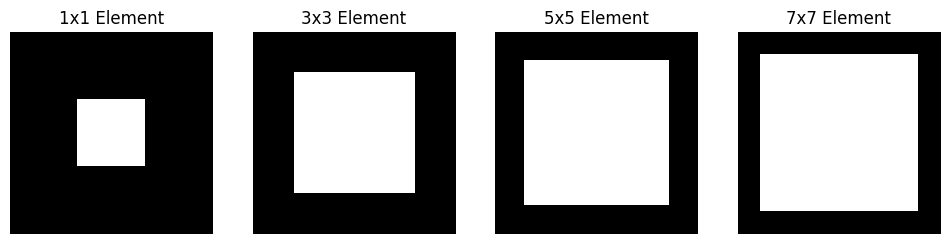

In [1]:
import numpy as np
import matplotlib.pyplot as plt


def create_kernel_with_border(size, border_size=1):
    kernel = np.ones((size, size), np.uint8) * 255
    if border_size > 0:
        kernel_with_border = np.pad(kernel, pad_width=border_size, mode='constant', constant_values=0)
        return kernel_with_border
    return kernel

kernel_3x3 = create_kernel_with_border(3)
kernel_5x5 = create_kernel_with_border(5)
kernel_7x7 = create_kernel_with_border(7)
kernel_1x1 = create_kernel_with_border(1)

fig, axs = plt.subplots(1, 4, figsize=(12, 3))
axs[0].imshow(kernel_1x1, cmap='gray')
axs[0].set_title('1x1 Element')
axs[0].axis('off')

axs[1].imshow(kernel_3x3, cmap='gray')
axs[1].set_title('3x3 Element')
axs[1].axis('off')

axs[2].imshow(kernel_5x5, cmap='gray')
axs[2].set_title('5x5 Element')
axs[2].axis('off')

axs[3].imshow(kernel_7x7, cmap='gray')
axs[3].set_title('7x7 Element')
axs[3].axis('off')



plt.show()


### b) getStructuringElement 
  
Często zdaża się, że kdratowy element strukturalny nie jest odpowiedni. W celu utworzenia elementu eliptycznego można wykorzystać wbudowaną funkcję OpenCV `cv.getStructuringElement()`, gdzie należy zdefiniować kształt oraz rozmiar jądra. Więcej informacji można przeczytać w dokumentacji [tutaj](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#gac2db39b56866583a95a5680313c314ad) i [tutaj](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga7be549266bad7b2e6a04db49827f9f32) 


Proszę o stworzenie elemntów typu CROSS i ELLIPSE o rozmiarach $3x3$,$5x5$,$7x7$,$11x11$ oraz wyświetlenie ich. 

CROSS type structural elements:


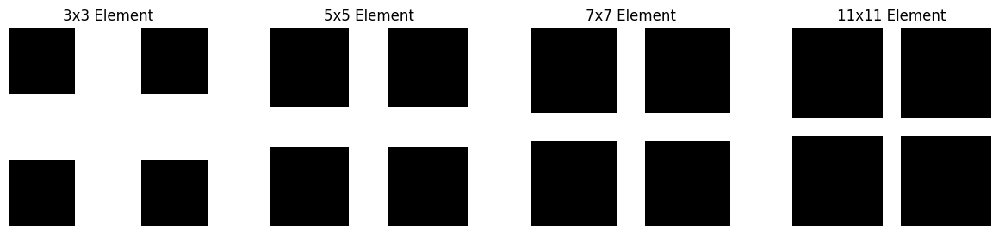

ELLIPSE type structural elements:


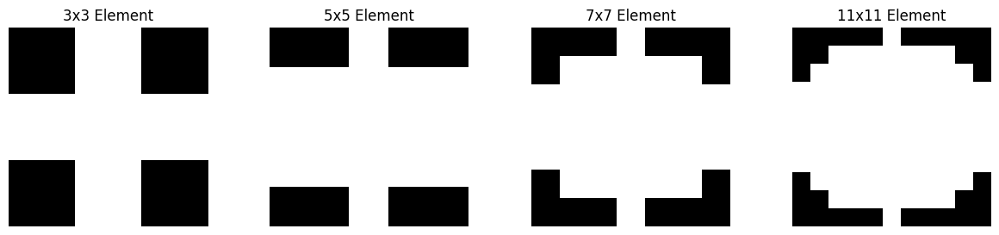

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def create_display_struct_elements(sizes, element_type):
    fig, axs = plt.subplots(1, len(sizes), figsize=(15, 3))
    
    for i, size in enumerate(sizes):
        struct_element = cv2.getStructuringElement(element_type, (size, size))
        
        axs[i].imshow(struct_element, cmap='gray')
        axs[i].set_title(f'{size}x{size} Element')
        axs[i].axis('off')
    
    plt.show()

sizes = [3, 5, 7, 11]

print("CROSS type structural elements:")
create_display_struct_elements(sizes, cv2.MORPH_CROSS)

print("ELLIPSE type structural elements:")
create_display_struct_elements(sizes, cv2.MORPH_ELLIPSE)


## Zadanie 2 - Podstawowe operacje morfologiczne 

W zadaniach należy wykorzystać obraz utworzony na pierwszym laboratorium, bez szumu (obraz z liniami) oraz jeden z obrazów wykonanych w laboratorium). 
  
### a) Erozja 
  
Dla zadanych obrazów należy wykonać operację erozji dla 3 rodzai elementów strukturalnych oraz rozmiarów $5x5$,$7x7$,$11x11$. Proszę wykonać analizy dla obrazów binarnych oraz monochromatycznych. 

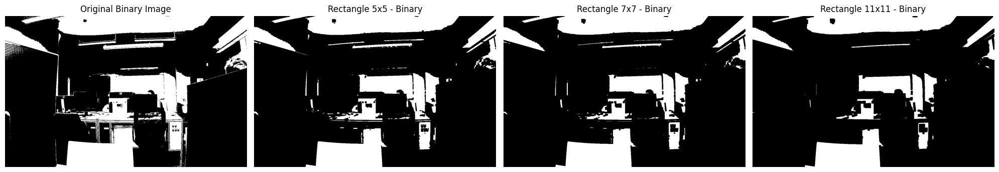

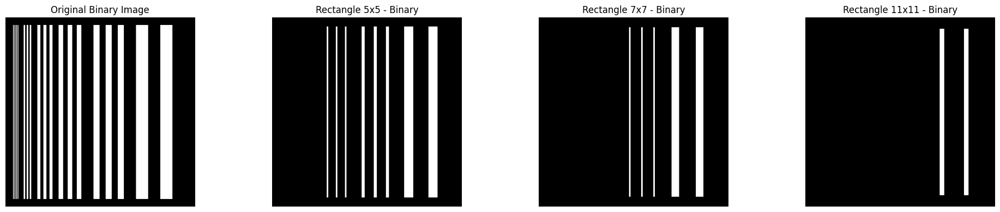

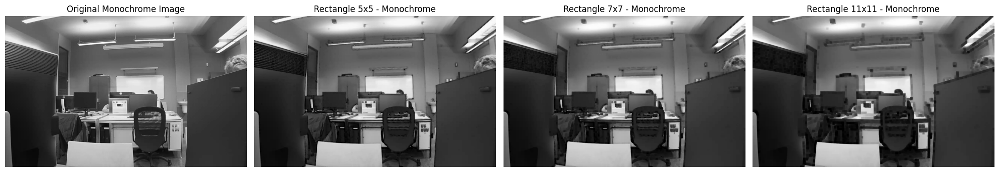

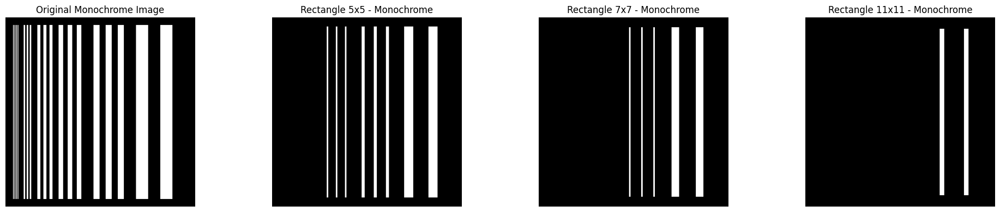

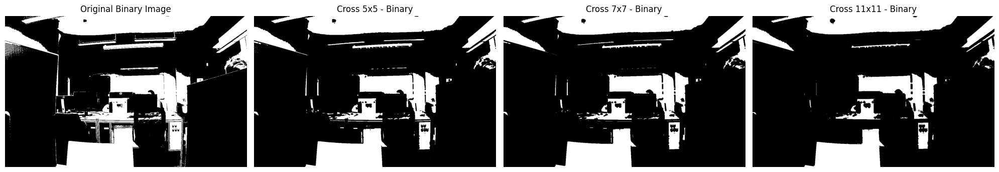

...

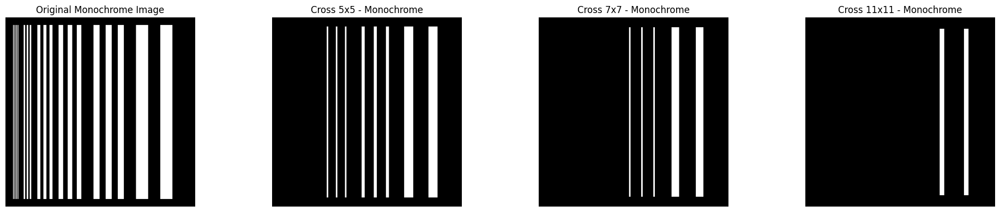

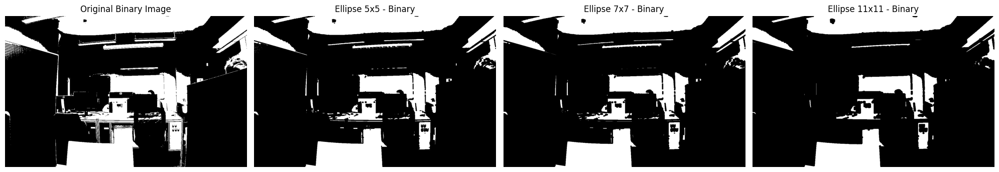

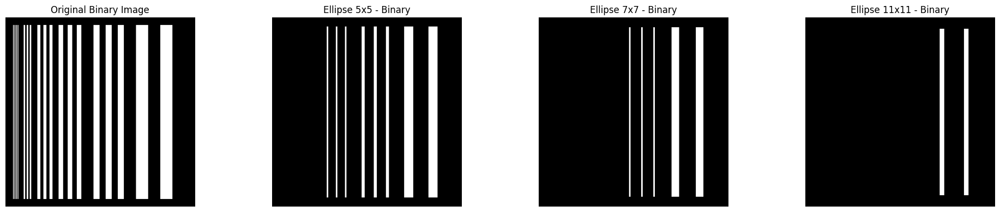

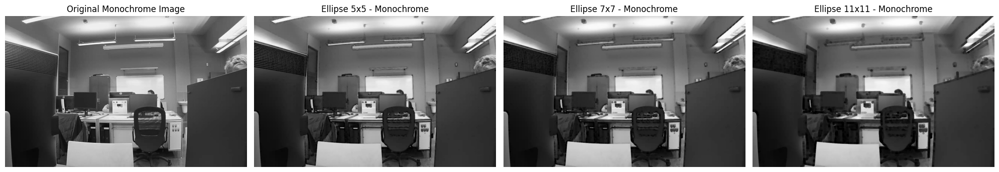

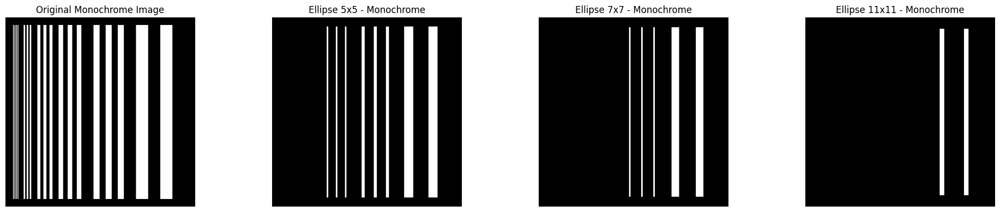

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def create_kernel(size, element_type):
    return cv2.getStructuringElement(element_type, (size, size))

def apply_erosion(image, kernel):
    return cv2.erode(image, kernel)

def apply_and_show_erosion(image_path, element_type, element_name, image_type):
    original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image_type == 'binary':
        _, processed_image = cv2.threshold(original_image, 127, 255, cv2.THRESH_BINARY)
    elif image_type == 'monochrome':
        processed_image = original_image
    else:
        raise ValueError("Image type must be 'binary' or 'monochrome'")

    sizes = [5, 7, 11]

    fig, axs = plt.subplots(1, len(sizes) + 1, figsize=(20, 4))

    axs[0].imshow(processed_image, cmap='gray')
    axs[0].set_title(f'Original {image_type.capitalize()} Image')
    axs[0].axis('off')

    for i, size in enumerate(sizes):
        kernel = create_kernel(size, element_type)
        eroded_image = apply_erosion(processed_image, kernel)

        axs[i+1].imshow(eroded_image, cmap='gray')
        axs[i+1].set_title(f'{element_name} {size}x{size} - {image_type.capitalize()}')
        axs[i+1].axis('off')

    plt.tight_layout()
    plt.show()

shapes = {'Rectangle': cv2.MORPH_RECT, 'Cross': cv2.MORPH_CROSS, 'Ellipse': cv2.MORPH_ELLIPSE}

image_path = r'zdjecia\Axis M1034_bezpieczenstwo\Kamera 4_2022-11-15_07_44_26_520.jpg'
image_path2 = r'lab1_synthetic.png'

for shape_name, shape in shapes.items():
    for image_type in ['binary', 'monochrome']:
        apply_and_show_erosion(image_path, shape, shape_name, image_type)
        apply_and_show_erosion(image_path2, shape, shape_name, image_type)


#### Wnioski 

- Erozja na obrazach binarnych jest bardziej wyraźna i łatwiejsza do zidentyfikowania. Efekty erozji są bardziej kontrastowe, ponieważ obraz binarny składa się tylko z dwóch wartości pikseli.
- W obrazach monochromatycznych, erozja wpływa na różne odcienie szarości, co może prowadzić do subtelniejszych zmian. Efekty erozji nie są tak dramatyczne, ale mogą być bardziej szczegółowe.
- Wraz ze wzrostem rozmiaru elementu strukturalnego, erozja staje się bardziej znacząca. Większe elementy strukturalne usuwają więcej pikseli z krawędzi obiektów.
- Dla mniejszych elementów strukturalnych, erozja jest delikatniejsza i może być mniej zauważalna
- Różne kształty elementów strukturalnych (prostokąt, krzyż, elipsa) wpływają na charakterystykę erozji. Na przykład, krzyż może preferencyjnie erodować piksele wzdłuż pionowych i poziomych linii.
- Kształt elementu strukturalnego może być użyty do celowego kształtowania erozji w zależności od struktury obrazu i pożądanego efektu.
- Wąskie białe linie w drugim zdjięciu zostały całkowicie usunięte - jest to spowodowane tym, że element strukturalny był większy niż szerokość linii, co oznacza, że podczas erozji zawsze znajdowały się czarne piksele w obrębie elementu strukturalnego, co skutkowało zastąpieniem białych pikseli wartością czarną.

### b) Dylatacja 
  
Dla zadanych obrazów należy wykonać operację dylatacji dla 3 rodzai elementów strukturalnych oraz rozmiarów $5x5$,$7x7$,$11x11$. Proszę wykonać analizy dla obrazów binarnych oraz monochromatycznych. 

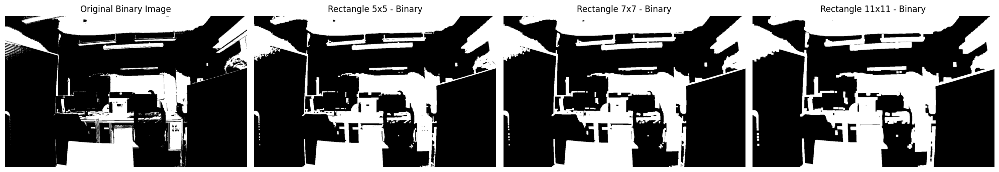

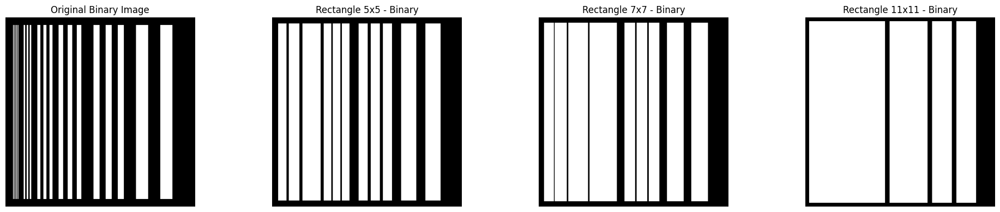

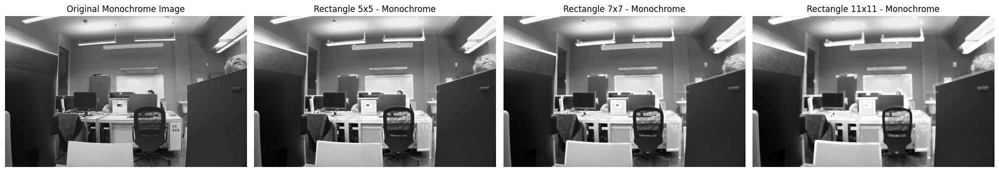

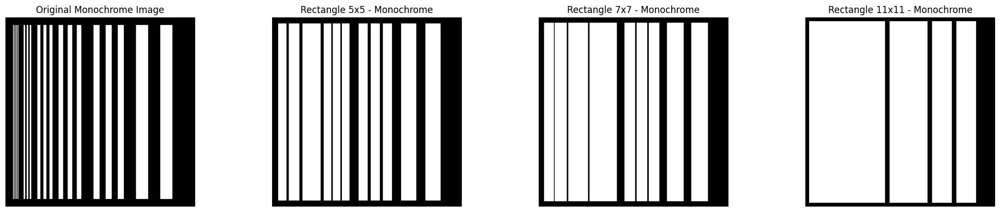

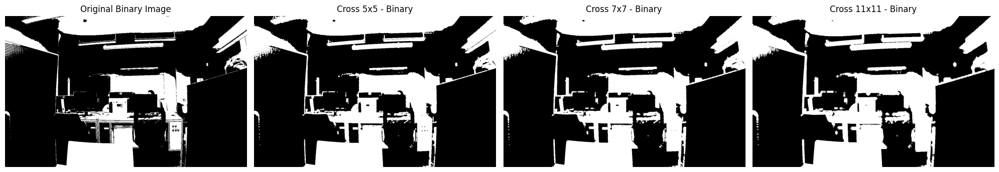

...

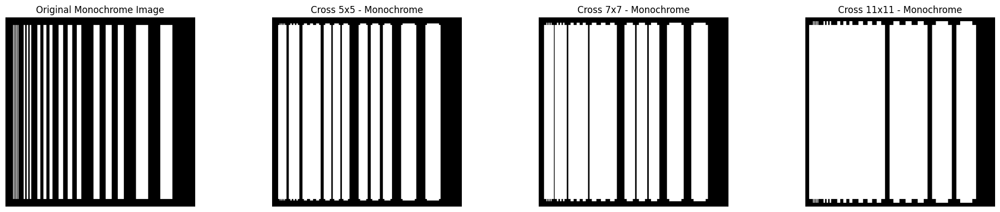

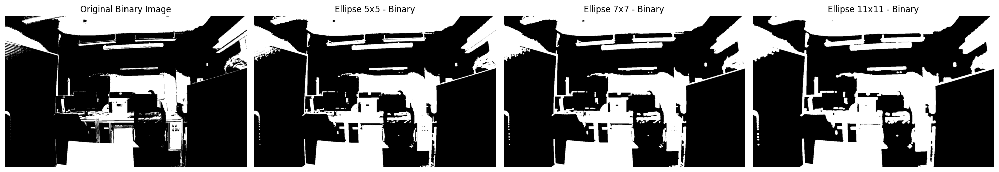

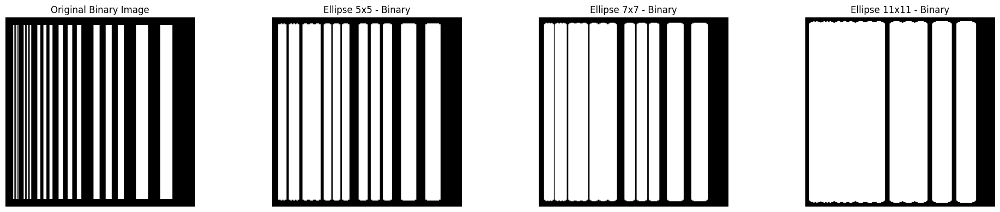

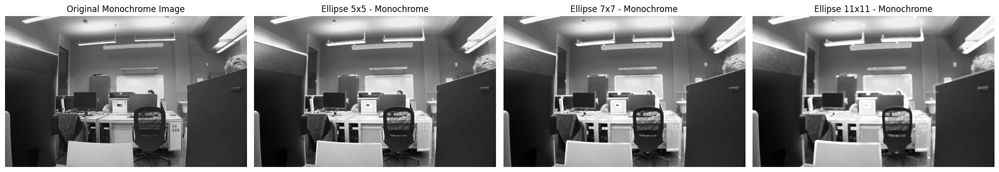

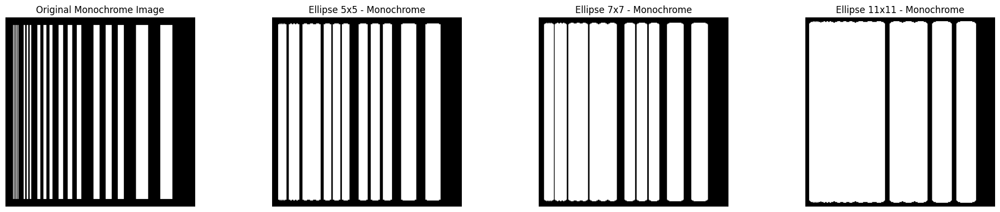

In [4]:
def apply_and_show_dilation(image_path, element_type, element_name, image_type):
    original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image_type == 'binary':
        _, processed_image = cv2.threshold(original_image, 127, 255, cv2.THRESH_BINARY)
    elif image_type == 'monochrome':
        processed_image = original_image
    else:
        raise ValueError("Image type must be 'binary' or 'monochrome'")

    sizes = [5, 7, 11]

    fig, axs = plt.subplots(1, len(sizes) + 1, figsize=(20, 4))

    axs[0].imshow(processed_image, cmap='gray')
    axs[0].set_title(f'Original {image_type.capitalize()} Image')
    axs[0].axis('off')

    for i, size in enumerate(sizes):
        kernel = create_kernel(size, element_type)
        dilated_image = cv2.dilate(processed_image, kernel)

        axs[i+1].imshow(dilated_image, cmap='gray')
        axs[i+1].set_title(f'{element_name} {size}x{size} - {image_type.capitalize()}')
        axs[i+1].axis('off')

    plt.tight_layout()
    plt.show()

shapes = {'Rectangle': cv2.MORPH_RECT, 'Cross': cv2.MORPH_CROSS, 'Ellipse': cv2.MORPH_ELLIPSE}

image_path = r'zdjecia\Axis M1034_bezpieczenstwo\Kamera 4_2022-11-15_07_44_26_520.jpg'
image_path2 = r'lab1_synthetic.png'

for shape_name, shape in shapes.items():
    for image_type in ['binary', 'monochrome']:
        apply_and_show_dilation(image_path, shape, shape_name, image_type)
        apply_and_show_dilation(image_path2, shape, shape_name, image_type)


#### Wnioski
- Dylatacja powiększa białe obszary na obrazie binarnym, co prowadzi do łączenia się blisko położonych obiektów. W przypadku obrazów monochromatycznych, dylatacja powoduje zwiększenie jasności wokół jasnych elementów obrazu.
- Im większy element strukturalny, tym silniejszy efekt dylatacji. Duże elementy mogą spowodować znaczące złączenie oddzielnych obiektów lub cech.
- Drobne szczegóły mogą zostać "wzmocnione" przez dylatację przy użyciu małych elementów strukturalnych, co jest przydatne w niektórych zastosowaniach, takich jak wypełnianie drobnych przerw lub dziur w obiektach. 
- Różne kształty elementów strukturalnych (prostokąt, krzyż, elipsa) prowadzą do różnych wyników dylatacji. Na przykład, elipsa może nieco "zaokrąglić" krawędzie obiektów po dylatacji.

### c) Otwarcie
  
Dla zadanych obrazów należy wykonać operację otwarcia dla 3 rodzai elementów strukturalnych oraz rozmiarów $5x5$,$7x7$,$11x11$. Proszę wykonać analizy dla obrazów binarnych oraz monochromatycznych. 

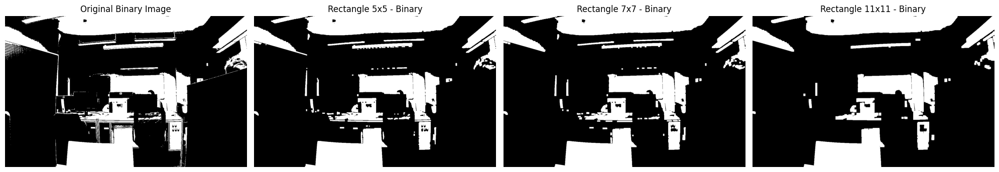

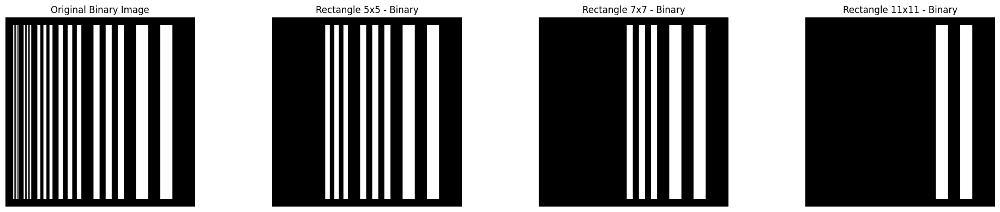

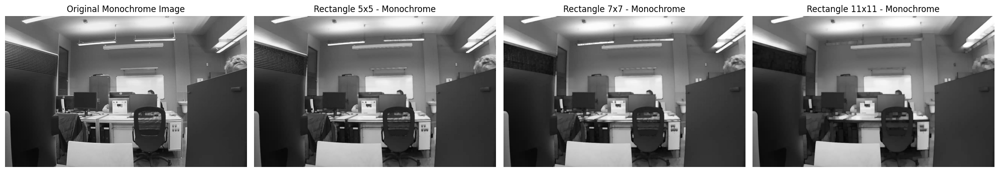

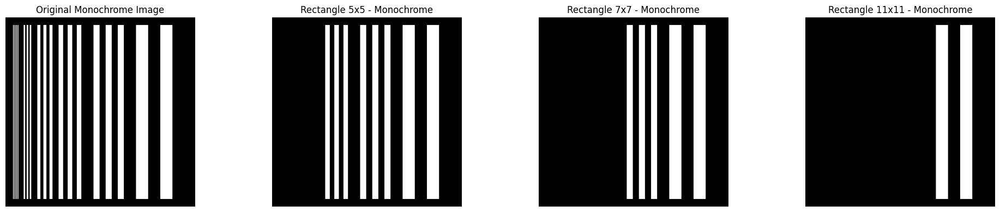

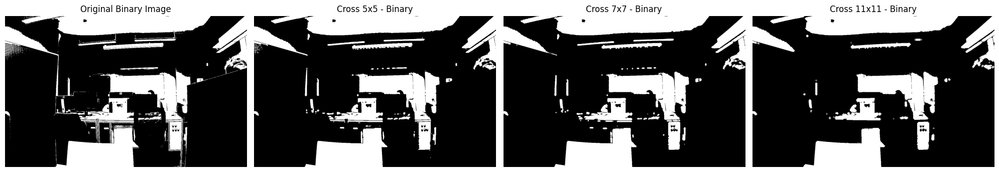

...

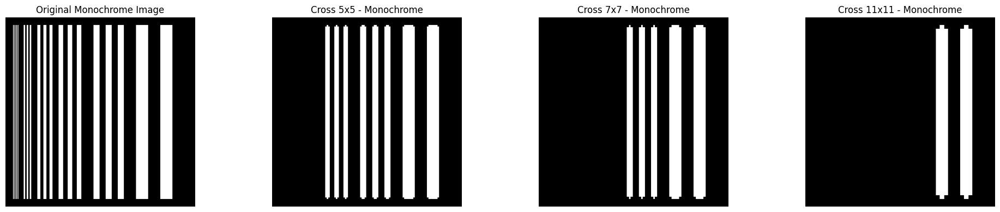

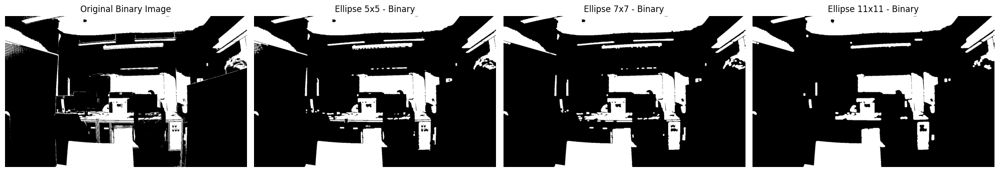

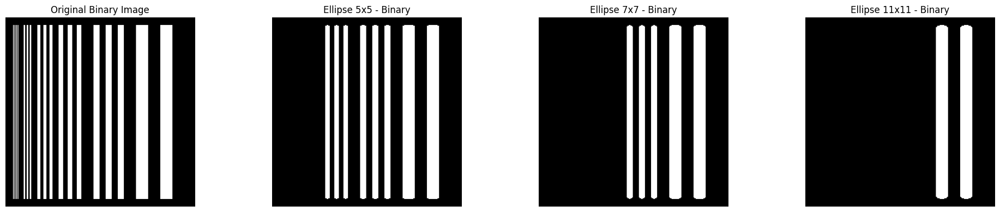

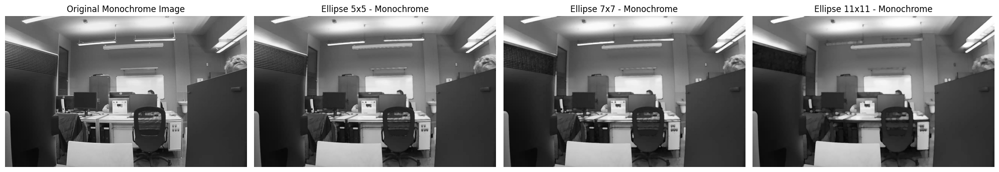

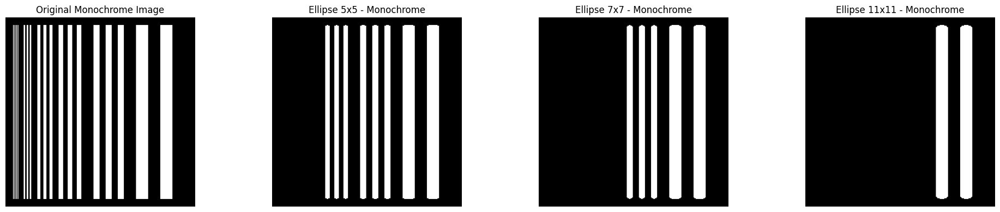

In [5]:
def apply_and_show_opening(image_path, element_type, element_name, image_type):
    original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image_type == 'binary':
        _, processed_image = cv2.threshold(original_image, 127, 255, cv2.THRESH_BINARY)
    elif image_type == 'monochrome':
        processed_image = original_image
    else:
        raise ValueError("Image type must be 'binary' or 'monochrome'")

    sizes = [5, 7, 11]

    fig, axs = plt.subplots(1, len(sizes) + 1, figsize=(20, 4))

    axs[0].imshow(processed_image, cmap='gray')
    axs[0].set_title(f'Original {image_type.capitalize()} Image')
    axs[0].axis('off')

    for i, size in enumerate(sizes):
        kernel = create_kernel(size, element_type)
        opened_image = cv2.morphologyEx(processed_image, cv2.MORPH_OPEN, kernel)

        axs[i+1].imshow(opened_image, cmap='gray')
        axs[i+1].set_title(f'{element_name} {size}x{size} - {image_type.capitalize()}')
        axs[i+1].axis('off')

    plt.tight_layout()
    plt.show()

shapes = {'Rectangle': cv2.MORPH_RECT, 'Cross': cv2.MORPH_CROSS, 'Ellipse': cv2.MORPH_ELLIPSE}

image_path = r'zdjecia\Axis M1034_bezpieczenstwo\Kamera 4_2022-11-15_07_44_26_520.jpg'
image_path2 = r'lab1_synthetic.png'

for shape_name, shape in shapes.items():
    for image_type in ['binary', 'monochrome']:
        apply_and_show_opening(image_path, shape, shape_name, image_type)
        apply_and_show_opening(image_path2, shape, shape_name, image_type)


#### Wnioski
- Operacja otwarcia skutecznie usuwa małe obiekty i szumy z obrazu, które są mniejsze niż użyty element strukturalny. Dzieje się tak dzięki erozji, która usuwa małe elementy, a następnie dylatacji, która przywraca rozmiar większych obiektów.
- Otwarcie może zmieniać charakterystykę tekstur i wzorów na obrazie, co może być zarówno pożądane, jak i niepożądane w zależności od celu przetwarzania.
- Należy zachować ostrożność przy wyborze rozmiaru elementu strukturalnego, aby nie spowodować nadmiernej erozji, która może usunąć ważne cechy obrazu.
- Otwarcie może nie być odpowiednie, jeśli celowe jest zachowanie bardzo drobnych szczegółów obrazu.

### c) Zamknięcie  
  
Dla zadanych obrazów należy wykonać operację zamknięcia dla 3 rodzai elementów strukturalnych oraz rozmiarów $5x5$,$7x7$,$11x11$. Proszę wykonać analizy dla obrazów binarnych oraz monochromatycznych. 

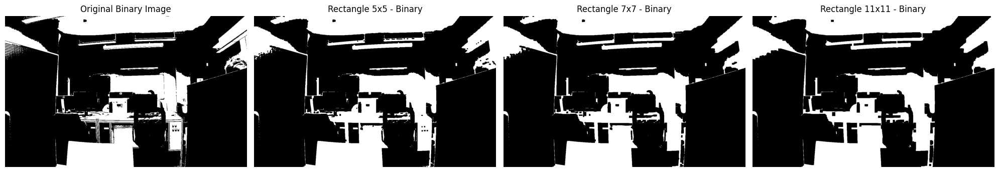

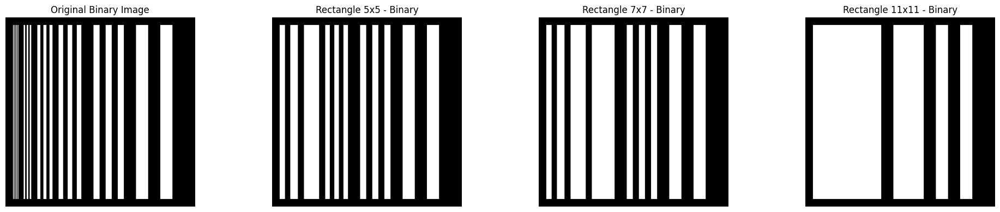

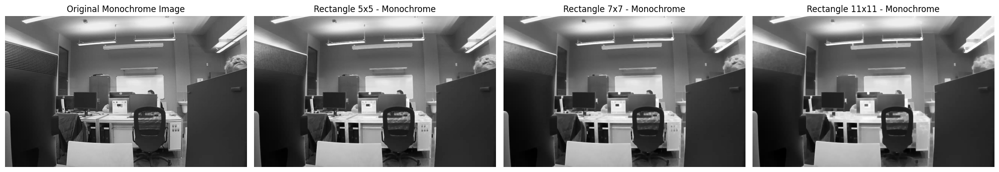

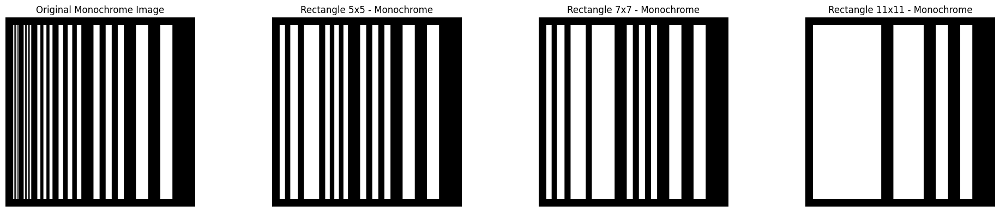

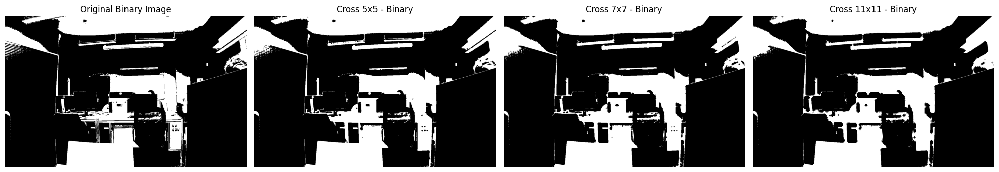

...

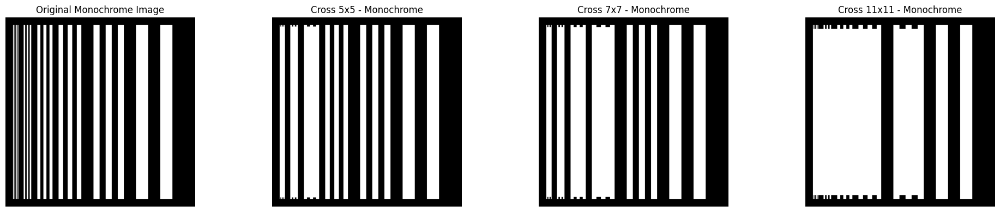

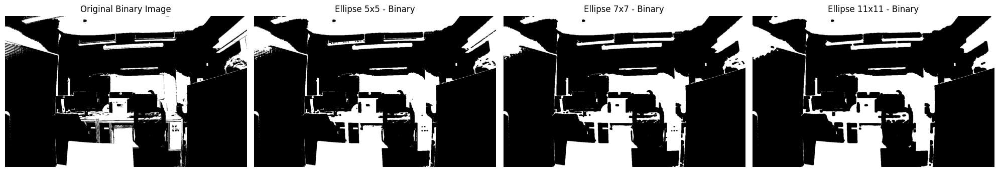

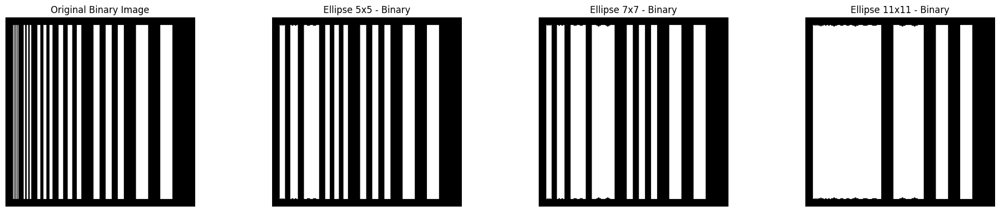

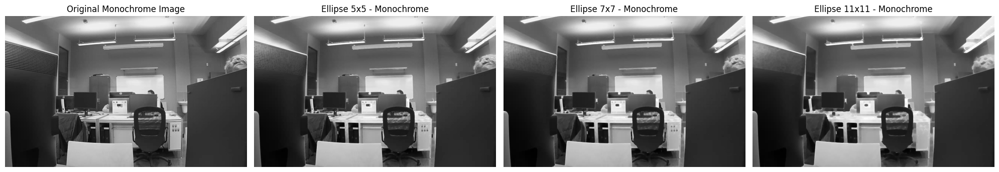

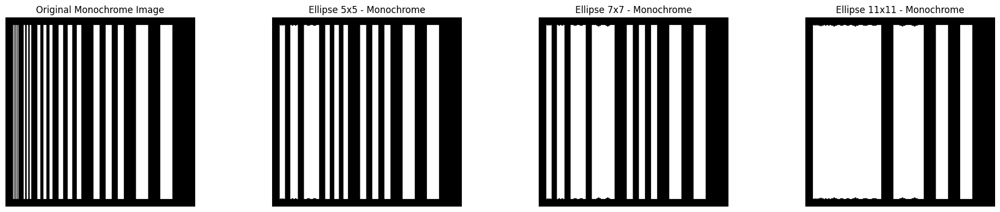

In [6]:
def apply_and_show_closing(image_path, element_type, element_name, image_type):
    original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image_type == 'binary':
        _, processed_image = cv2.threshold(original_image, 127, 255, cv2.THRESH_BINARY)
    elif image_type == 'monochrome':
        processed_image = original_image
    else:
        raise ValueError("Image type must be 'binary' or 'monochrome'")

    sizes = [5, 7, 11]

    fig, axs = plt.subplots(1, len(sizes) + 1, figsize=(20, 4))

    axs[0].imshow(processed_image, cmap='gray')
    axs[0].set_title(f'Original {image_type.capitalize()} Image')
    axs[0].axis('off')

    for i, size in enumerate(sizes):
        kernel = create_kernel(size, element_type)
        closed_image = cv2.morphologyEx(processed_image, cv2.MORPH_CLOSE, kernel)

        axs[i+1].imshow(closed_image, cmap='gray')
        axs[i+1].set_title(f'{element_name} {size}x{size} - {image_type.capitalize()}')
        axs[i+1].axis('off')

    plt.tight_layout()
    plt.show()

shapes = {'Rectangle': cv2.MORPH_RECT, 'Cross': cv2.MORPH_CROSS, 'Ellipse': cv2.MORPH_ELLIPSE}

image_path = r'zdjecia\Axis M1034_bezpieczenstwo\Kamera 4_2022-11-15_07_44_26_520.jpg'
image_path2 = r'lab1_synthetic.png'

for shape_name, shape in shapes.items():
    for image_type in ['binary', 'monochrome']:
        apply_and_show_closing(image_path, shape, shape_name, image_type)
        apply_and_show_closing(image_path2, shape, shape_name, image_type)


#### Wnioski
- Zamknięcie jest efektywne w wypełnianiu małych dziur i przerw w obiektach, co może być szczególnie przydatne w obrazach binarnych, gdzie chcemy zachować ciągłość obiektów.
- Poprzez dylatację, zamknięcie może spowodować łączenie się blisko położonych obiektów, co jest pożądane, gdy chcemy uwydatnić większe struktury kosztem drobniejszych szczegółów.
- Podobnie jak operacja otwarcia, zamknięcie zachowuje ogólną formę większych struktur. Połączenie dylatacji i erozji pozwala na wzmocnienie większych elementów obrazu przy jednoczesnym wygładzeniu ich krawędzi.
- Kształt i rozmiar elementu strukturalnego mają istotny wpływ na wynik zamknięcia. Należy dostosować element strukturalny tak, aby wypełniał oczekiwane przerwy bez nadmiernego złączania oddzielnych obiektów.
- Należy uważać, aby nie przeprowadzać nadmiernej dylatacji, która może prowadzić do zbyt dużego połączenia obiektów i utraty ważnych informacji.
- Operacja zamknięcia może nie być odpowiednia w sytuacjach, gdy drobne detale są kluczowe dla analizy obrazu.

## Zadanie 3 - Pozostałe operacje morfologiczne

W zadaniach należy wykorzystać obraz utworzony na pierwszym laboratorium, bez szumu (obraz z liniami) oraz jeden z obrazów wykonanych w laboratorium). 

### a) Gradient morfologiczny
  
Jest to różnica między diatacją i erozją, a wynikiem będzie obwiednia obiektu. 
  
Dla zadanych obrazów należy wykonać operację gradientu morfologicznego dla 3 rodzai elementów strukturalnych oraz rozmiarów $5x5$,$7x7$,$11x11$. Można się zapoznać z dokumentacją [polecenia.](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga67493776e3ad1a3df63883829375201f) Proszę wykonać analizy dla obrazów binarnych oraz monochromatycznych. 

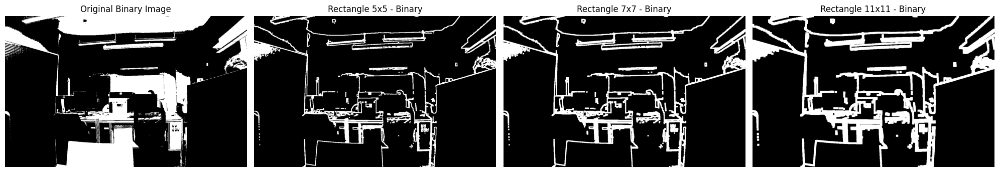

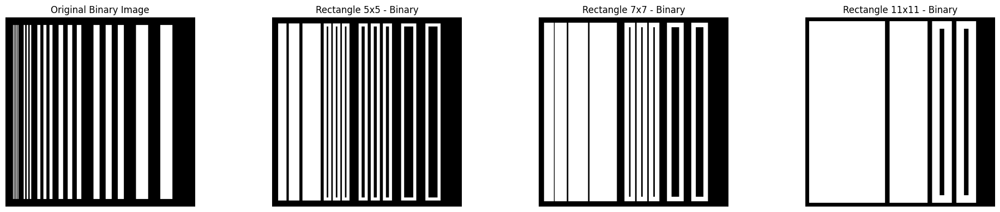

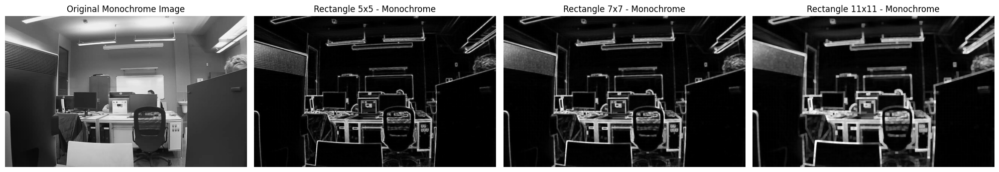

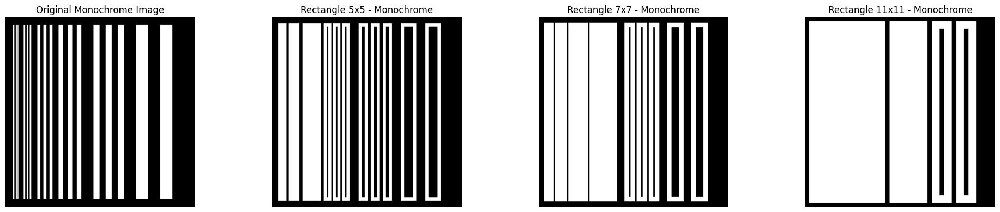

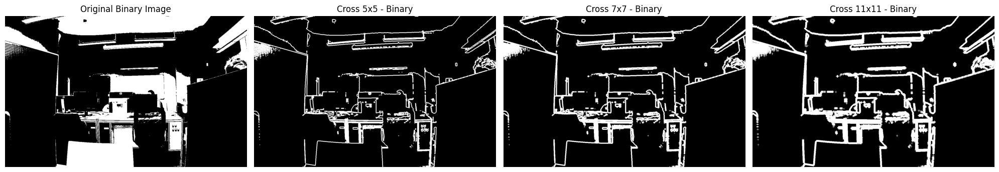

...

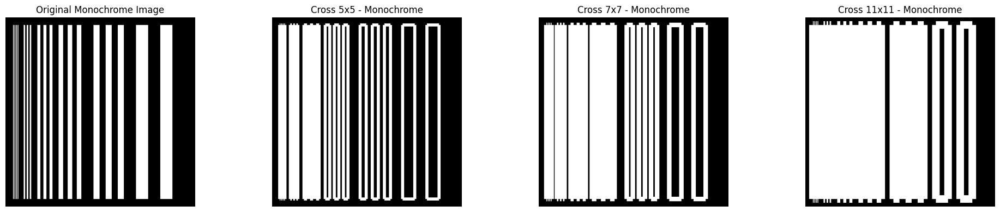

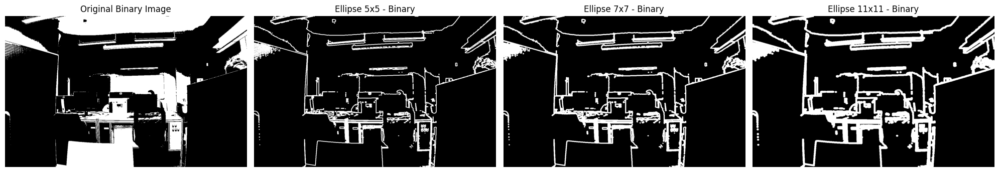

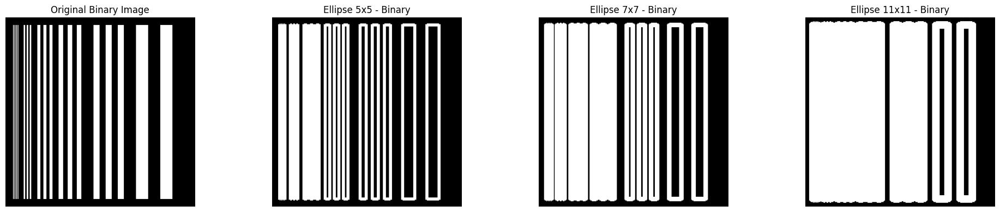

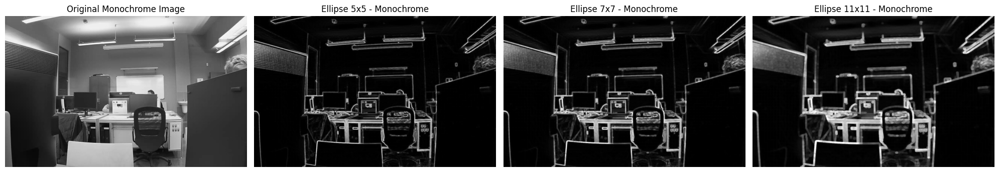

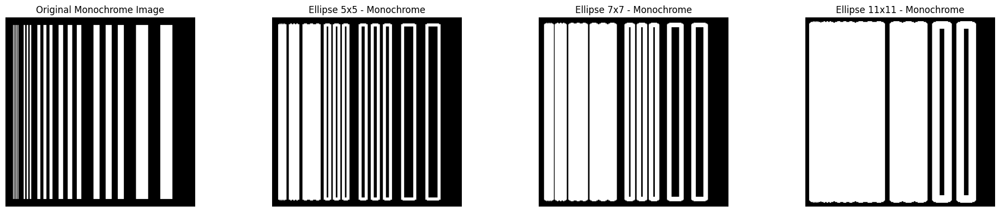

In [7]:
def apply_and_show_morphological_gradient(image_path, element_type, element_name, image_type):
    original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image_type == 'binary':
        _, processed_image = cv2.threshold(original_image, 127, 255, cv2.THRESH_BINARY)
    elif image_type == 'monochrome':
        processed_image = original_image
    else:
        raise ValueError("Image type must be 'binary' or 'monochrome'")

    sizes = [5, 7, 11]

    fig, axs = plt.subplots(1, len(sizes) + 1, figsize=(20, 4))

    axs[0].imshow(processed_image, cmap='gray')
    axs[0].set_title(f'Original {image_type.capitalize()} Image')
    axs[0].axis('off')

    for i, size in enumerate(sizes):
        kernel = create_kernel(size, element_type)
        gradient_image = cv2.morphologyEx(processed_image, cv2.MORPH_GRADIENT, kernel)

        axs[i+1].imshow(gradient_image, cmap='gray')
        axs[i+1].set_title(f'{element_name} {size}x{size} - {image_type.capitalize()}')
        axs[i+1].axis('off')

    plt.tight_layout()
    plt.show()

shapes = {'Rectangle': cv2.MORPH_RECT, 'Cross': cv2.MORPH_CROSS, 'Ellipse': cv2.MORPH_ELLIPSE}

image_path = r'zdjecia\Axis M1034_bezpieczenstwo\Kamera 4_2022-11-15_07_44_26_520.jpg'
image_path2 = r'lab1_synthetic.png'

for shape_name, shape in shapes.items():
    for image_type in ['binary', 'monochrome']:
        apply_and_show_morphological_gradient(image_path, shape, shape_name, image_type)
        apply_and_show_morphological_gradient(image_path2, shape, shape_name, image_type)


#### Wnioski
- Gradient morfologiczny skutecznie podkreśla krawędzie obiektów na obrazie, co może być wykorzystane w procesach wykrywania krawędzi i segmentacji.
- Na obrazach binarnych gradient morfologiczny tworzy wyraźną obwiednię wokół obiektów. Na obrazach monochromatycznych efekt jest bardziej subtelny i zależy od kontrastu pomiędzy obiektami a tłem.
- Większe elementy strukturalne tworzą szersze krawędzie, podczas gdy mniejsze elementy mogą lepiej oddawać drobne detale krawędzi.
- Kształt elementu strukturalnego wpływa na kształt krawędzi w obwiedni. Na przykład, eliptyczne elementy mogą tworzyć bardziej zaokrąglone krawędzie.
- Przy za dużym rozmiarze elemenru strukturalnego może wystąpić utrata cennych informacji ze zdjęcia poprzez nachodzenie sie krtawędzi

### b) Top Hat
  
Operacja Top Hat jest różnicą między obrazem wejściowym a wynikiem operacji Otwracia. 
  
Dla zadanych obrazów należy wykonać operację Top Hat dla 3 rodzai elementów strukturalnych oraz rozmiarów $5x5$,$7x7$,$11x11$. Proszę wykonać analizy dla obrazów binarnych oraz monochromatycznych. 

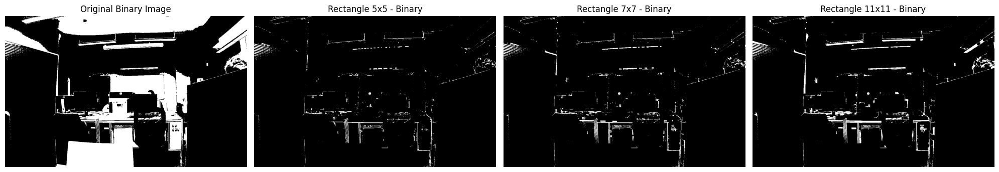

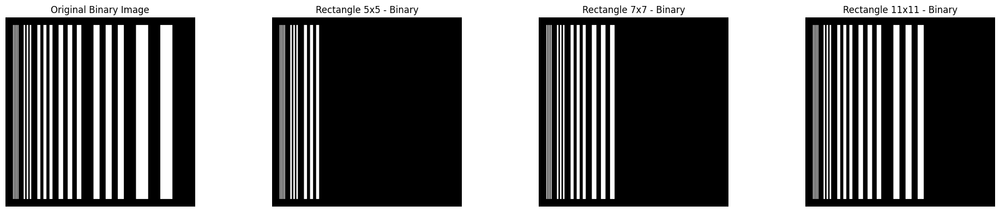

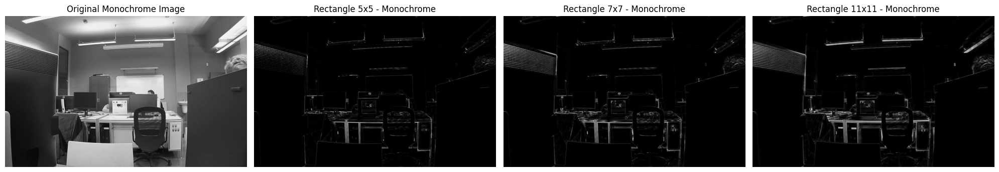

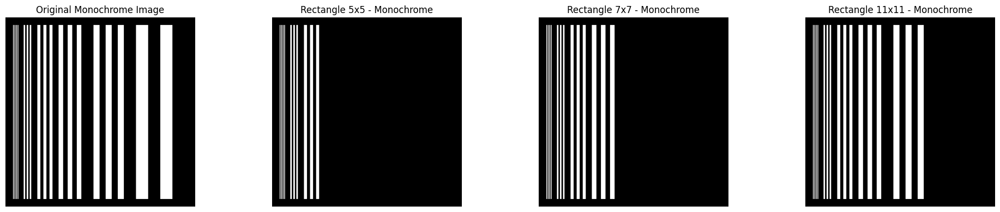

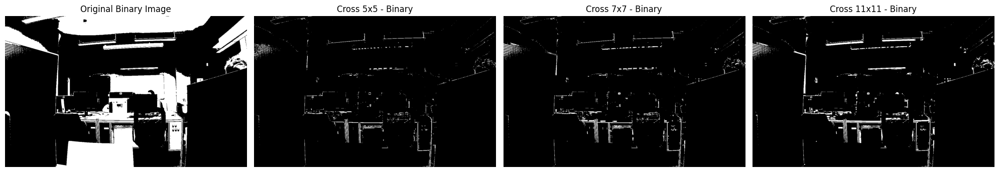

...

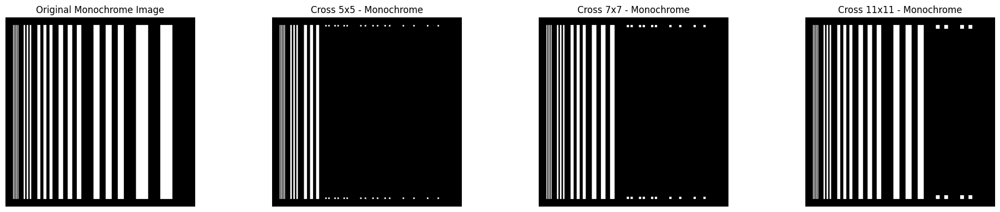

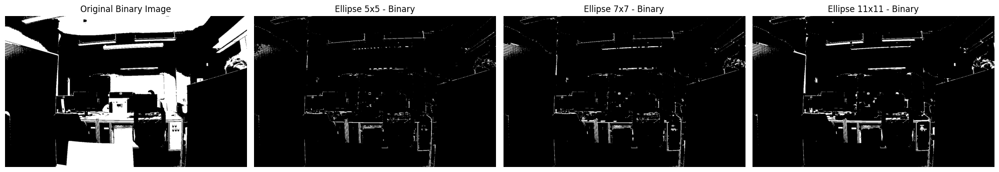

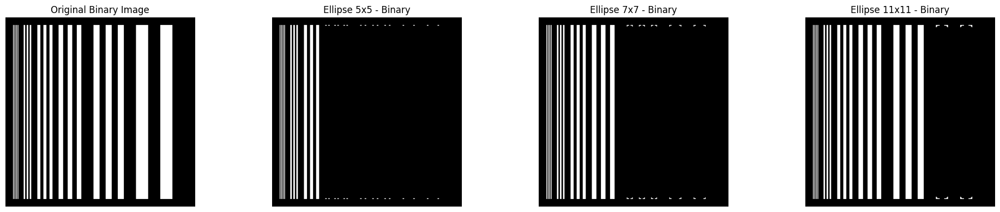

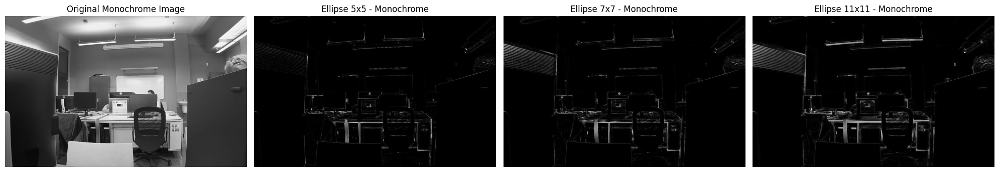

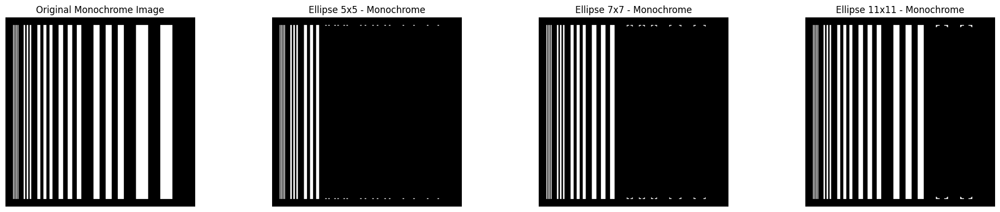

In [8]:
def apply_and_show_top_hat(image_path, element_type, element_name, image_type):
    original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image_type == 'binary':
        _, processed_image = cv2.threshold(original_image, 127, 255, cv2.THRESH_BINARY)
    elif image_type == 'monochrome':
        processed_image = original_image
    else:
        raise ValueError("Image type must be 'binary' or 'monochrome'")

    sizes = [5, 7, 11]

    fig, axs = plt.subplots(1, len(sizes) + 1, figsize=(20, 4))

    axs[0].imshow(processed_image, cmap='gray')
    axs[0].set_title(f'Original {image_type.capitalize()} Image')
    axs[0].axis('off')

    for i, size in enumerate(sizes):
        kernel = create_kernel(size, element_type)
        top_hat_image = cv2.morphologyEx(processed_image, cv2.MORPH_TOPHAT, kernel)

        axs[i+1].imshow(top_hat_image, cmap='gray')
        axs[i+1].set_title(f'{element_name} {size}x{size} - {image_type.capitalize()}')
        axs[i+1].axis('off')

    plt.tight_layout()
    plt.show()

shapes = {'Rectangle': cv2.MORPH_RECT, 'Cross': cv2.MORPH_CROSS, 'Ellipse': cv2.MORPH_ELLIPSE}

image_path = r'zdjecia\Axis M1034_bezpieczenstwo\Kamera 4_2022-11-15_07_44_26_520.jpg'
image_path2 = r'lab1_synthetic.png'

for shape_name, shape in shapes.items():
    for image_type in ['binary', 'monochrome']:
        apply_and_show_top_hat(image_path, shape, shape_name, image_type)
        apply_and_show_top_hat(image_path2, shape, shape_name, image_type)


#### Wnioski
- "Top Hat" jest skuteczny w wyróżnianiu małych jasnych elementów na obrazie, które mogą być niewidoczne na tle innych jasnych struktur.
- Operacja ta może poprawić kontrast małych obiektów w stosunku do tła, co jest przydatne w przetwarzaniu obrazów medycznych, analizie obrazów satelitarnych oraz w aplikacjach przemysłowych.
- Wybór rozmiaru i kształtu elementu strukturalnego powinien być dostosowany do wielkości i kształtu cech, które chcemy wyróżnić. Nieodpowiedni wybór może spowodować brak pożądanych efektów.
- Operacja "Top Hat" może być użyta do usunięcia jednolitego lub szumowego tła, które nie zostało usunięte podczas otwarcia.

### c) Black Hat
 
Operacja Black Hat jest różnicą między wynikiem operacji zamknięcia, a obrazem wejściowym. 
  
Dla zadanych obrazów należy wykonać operację Balck Hat dla 3 rodzai elementów strukturalnych oraz rozmiarów $5x5$,$7x7$,$11x11$. Proszę wykonać analizy dla obrazów binarnych oraz monochromatycznych. 

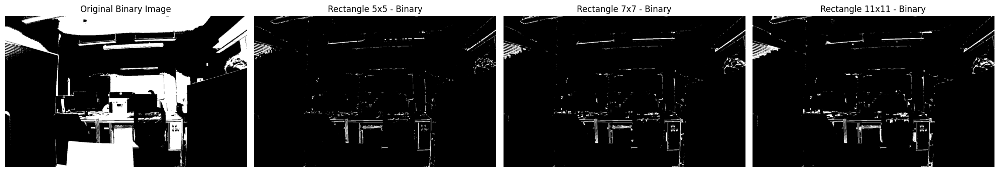

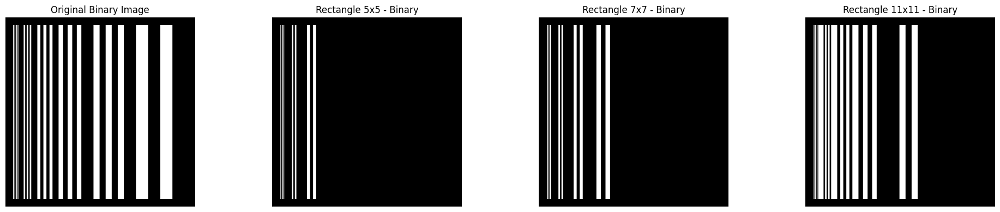

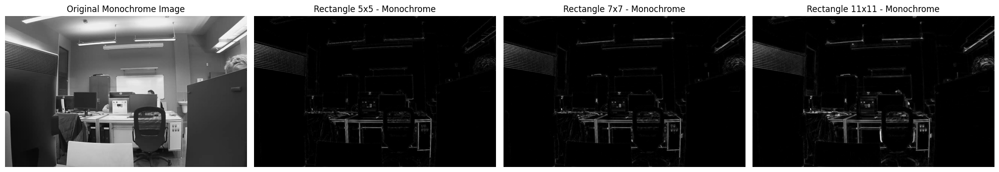

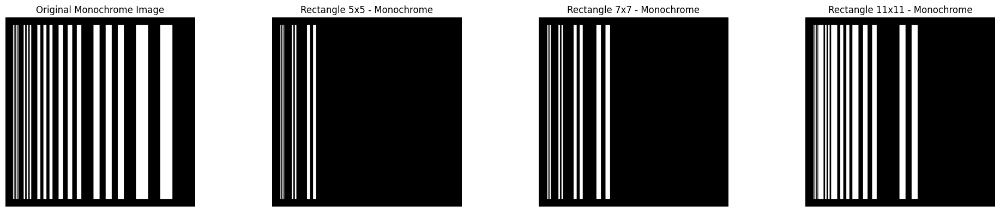

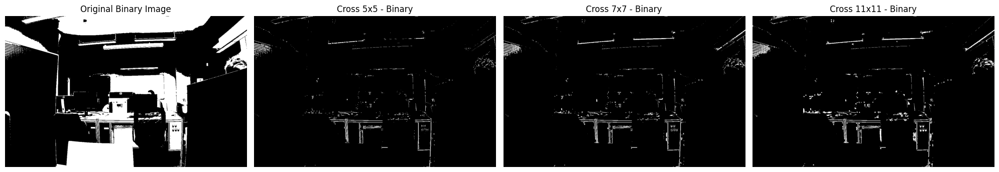

...

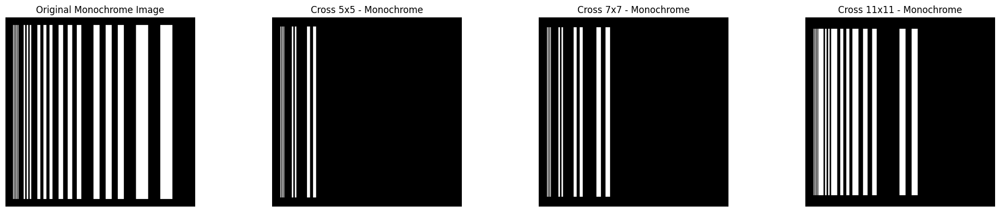

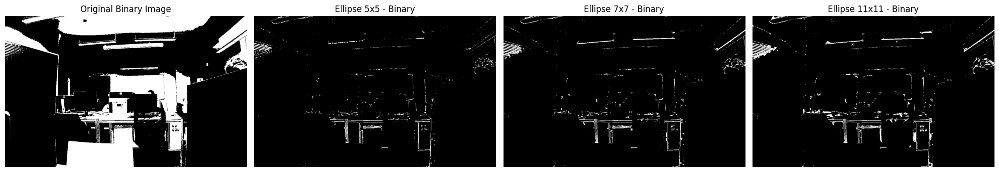

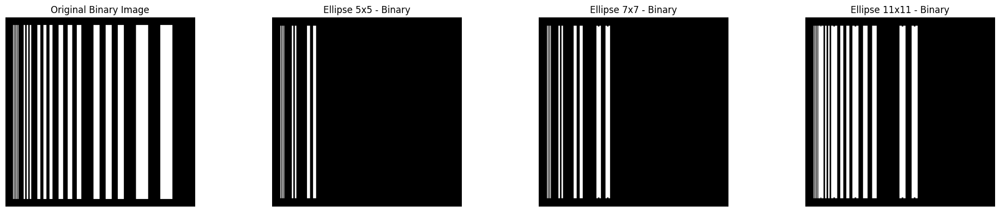

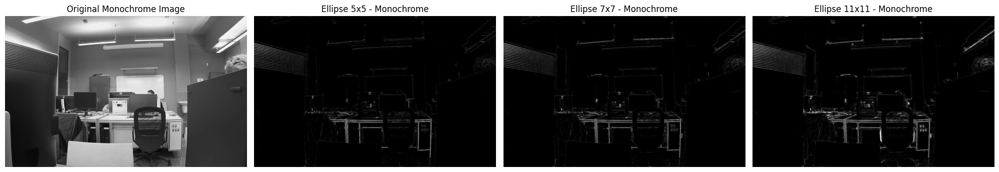

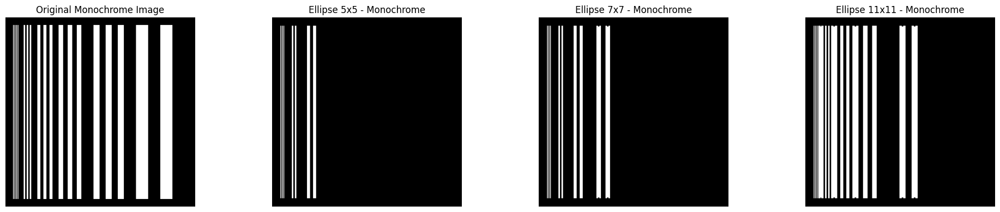

In [9]:
def apply_and_show_black_hat(image_path, element_type, element_name, image_type):
    original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image_type == 'binary':
        _, processed_image = cv2.threshold(original_image, 127, 255, cv2.THRESH_BINARY)
    elif image_type == 'monochrome':
        processed_image = original_image
    else:
        raise ValueError("Image type must be 'binary' or 'monochrome'")

    sizes = [5, 7, 11]

    fig, axs = plt.subplots(1, len(sizes) + 1, figsize=(20, 4))

    axs[0].imshow(processed_image, cmap='gray')
    axs[0].set_title(f'Original {image_type.capitalize()} Image')
    axs[0].axis('off')

    for i, size in enumerate(sizes):
        kernel = create_kernel(size, element_type)
        black_hat_image = cv2.morphologyEx(processed_image, cv2.MORPH_BLACKHAT, kernel)

        axs[i+1].imshow(black_hat_image, cmap='gray')
        axs[i+1].set_title(f'{element_name} {size}x{size} - {image_type.capitalize()}')
        axs[i+1].axis('off')

    plt.tight_layout()
    plt.show()

shapes = {'Rectangle': cv2.MORPH_RECT, 'Cross': cv2.MORPH_CROSS, 'Ellipse': cv2.MORPH_ELLIPSE}

image_path = r'zdjecia\Axis M1034_bezpieczenstwo\Kamera 4_2022-11-15_07_44_26_520.jpg'
image_path2 = r'lab1_synthetic.png'

for shape_name, shape in shapes.items():
    for image_type in ['binary', 'monochrome']:
        apply_and_show_black_hat(image_path, shape, shape_name, image_type)
        apply_and_show_black_hat(image_path2, shape, shape_name, image_type)


#### Wnioski
- Operacja "Black Hat" na obrazach binarnych wzmocni ciemne elementy, które mogą być otoczone jaśniejszym tłem, a które nie zostały w pełni zamknięte przez operację zamknięcia.
- Na obrazach monochromatycznych może podkreślić ciemne obszary o niskim kontraście, które są trudniejsze do zauważenia, szczególnie te, które są otoczone przez jaśniejsze regiony.
- "Black Hat" może ujawnić szczegółowe informacje strukturalne, takie jak mikro pęknięcia lub ubytki w materiałach, które mogą być kluczowe w inspekcjach technicznych lub medycznych obrazach diagnostycznych.
- Na obrazach binarnych, gdzie kontrast jest maksymalny, "Black Hat" może być wykorzystany do wyróżnienia niewielkich ciemnych elementów przeciwko jasnemu tłu.
- Na obrazach monochromatycznych operacja ta może uwydatniać subtelne wariacje intensywności, które mogą być ważne w niektórych zastosowaniach, jak analiza tekstur.